In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
from google.colab import drive
drive.mount('/content/drive')
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
!kaggle datasets download -d gpiosenka/sports-classification
!unzip sports-classification.zip

In [2]:
!pip install cloud-tpu-client==0.10 torch==1.11.0 https://storage.googleapis.com/tpu-pytorch/wheels/colab/torch_xla-1.11-cp37-cp37m-linux_x86_64.whl

     |████████████████████████████████| 152.9 MB 35 kB/s 
     |████████████████████████████████| 750.6 MB 10 kB/s 
     |████████████████████████████████| 57 kB 5.1 MB/s 
  Attempting uninstall: google-api-python-client
    Found existing installation: google-api-python-client 1.12.11
    Uninstalling google-api-python-client-1.12.11:
      Successfully uninstalled google-api-python-client-1.12.11
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.11.1+cu111 requires torch==1.10.0, but you have torch 1.11.0 which is incompatible.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.11.0 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch

In [1]:
import math
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss, classification_report
assert os.environ['COLAB_TPU_ADDR'], 'Make sure to select TPU from Edit > Notebook settings > Hardware accelerator'
import torch_xla
import torch_xla.core.xla_model as xm
import torch_xla.debug.metrics as met
import torch_xla.distributed.parallel_loader as pl
import torch_xla.distributed.xla_multiprocessing as xmp
import torch_xla.utils.utils as xu
import torchvision
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, SubsetRandomSampler, Subset
from torchvision import transforms as T


In [1]:
import math
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, log_loss, classification_report
assert os.environ['COLAB_TPU_ADDR'], 'Make sure to select TPU from Edit > Notebook settings > Hardware accelerator'
import torch_xla
import torch_xla.core.xla_model as xm
import torch_xla.debug.metrics as met
import torch_xla.distributed.parallel_loader as pl
import torch_xla.distributed.xla_multiprocessing as xmp
import torch_xla.utils.utils as xu
import torchvision
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, SubsetRandomSampler, Subset
from torchvision import transforms as T
import torchinfo
import shap
import captum
import gc
std=torch.Tensor([0.4687, 0.4667, 0.4540])
mean=torch.Tensor([0.2792, 0.2717, 0.2852])
v_trans=T.Compose([
                   T.ToTensor(),
                   T.Normalize(mean,std)])
test_set=ImageFolder('./test',transform=v_trans)
PATH = '0densenet121_tpu.pt'
model_dense = torchvision.models.densenet121()
model_dense.classifier = nn.Linear(1024, 100)
model_dense.load_state_dict(torch.load(PATH))
model_dense.eval()
gc.collect()
preprocess = torchvision.transforms.Compose([
   torchvision.transforms.Normalize(
       mean=[0.2792, 0.2717, 0.2852],
       std=[0.4687, 0.4667, 0.4540]
   )
])
gc.collect()
_X = torch.load('./x_set.pt')
y = torch.load('./y_set.pt')
X = torch.movedim(_X, 3, 1)
PATH = '/content/trained_gpudensenet121v3.pth'
model_dense_gpu = torchvision.models.densenet121(pretrained=False)#.to(device)
model_dense_gpu.classifier = nn.Linear(1024, 100)
model_dense_gpu.load_state_dict(torch.load(PATH,map_location=torch.device('cpu')))
_Xgpu = torch.load('./x_set_gpu.pt')
ygpu = torch.load('./y_set_gpu.pt')
Xgpu = torch.movedim(_Xgpu, 3, 1)
model_dense_gpu.eval()
import PIL
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
def show_images(images,model, k = 3,): 
    fig, ax = plt.subplots(k, 2, figsize=[6 * k, 6 * k])
    my_dict2 = {y:x for x,y in test_set.class_to_idx.items()}
    batch_size=1
    gc.collect()
    # ld=DataLoader(images,batch_size,num_workers=2,pin_memory=True)
    y_hat = torch.nn.functional.softmax(model(preprocess(images)), dim=1)
    preds = y_hat.amax(axis=1)
    preds_idx = y_hat.argmax(axis=1)
    print(preds)
    print(preds_idx)
    for i, image in enumerate(images):
        # image,_ = image
        pred = preds[i].item()
        pred_idx = preds_idx[i].item()
        # plt.figure(figsize=(16,16))
        ax[i%k, i//k].imshow(image.permute(1, 2, 0))
        ax[i%k, i//k].set_title(f"{pred_idx}: {my_dict2[pred_idx]} ({round(pred, 3)})")
        ax[i%k, i//k].axis('off')
gc.collect()
preds_gpu = torch.load('./preds_gpu.pt')
preds_idx_gpu = torch.load('./preds_idx_gpu.pt')
preds = torch.load('./preds.pt')
preds_idx = torch.load('./preds_idx.pt')
gc.collect()
def plot_photo(img):
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.imshow(img.cpu().permute([1,2,0]).squeeze())
    plt.show()
def show_image_mask_explanation(image, mask, explanation):
    fig, ax = plt.subplots(1, 3, figsize=[6 * 2, 6])
    ax[0].imshow(image.permute(1, 2, 0))
    ax[0].set_title("image")
    ax[1].imshow(mask, cmap="flag")
    ax[1].set_title("segmentation mask")
    ax[2].imshow(explanation, vmin=-1, vmax=1, cmap="RdBu")
    ax[2].set_title("explanation")
    plt.show()
from captum.attr import Lime
from skimage import segmentation
from captum.attr import visualization
from captum.attr import IntegratedGradients
def lime_explainer(model):
  return Lime(model)
def lime_explanation(idx,targ,model):
  explainer = lime_explainer(model)
  mask = segmentation.slic(
      _X[idx].permute(1, 2, 0).mean(axis=2), 
      n_segments=100, 
      compactness=0.1, 
      start_label=0,
    )
  mask = segmentation.quickshift(
      _X[idx].permute(1, 2, 0), 
      kernel_size=14, 
      max_dist=7, 
      ratio=0.5
    )
  attr = explainer.attribute(
      preprocess(_X[idx].unsqueeze(0)), 
      target=targ, 
      n_samples=200, 
      feature_mask=torch.as_tensor(mask),
      show_progress=True
    )
  show_image_mask_explanation(_X[idx], mask, attr[0].mean(axis=0))

def show_attr(idx,targ,model,attr=None):
    explainer = lime_explainer(model)
    mask = segmentation.quickshift(
      _X[idx].permute(1, 2, 0), 
      kernel_size=14, 
      max_dist=7, 
      ratio=0.5
    )
    if attr is None:
      attr = explainer.attribute(
        preprocess(_X[idx].unsqueeze(0)), 
        target=targ, 
        n_samples=200, 
        feature_mask=torch.as_tensor(mask),
        show_progress=True
      )
    attr_map = attr[0]
    visualization.visualize_image_attr(
        attr_map.permute(1, 2, 0).numpy(),
        method='heat_map',
        sign='all',
        show_colorbar=True
    )
def show_igs(idx,targ,model):
  exp_ig = IntegratedGradients(model)
  attr_ig = exp_ig.attribute(preprocess(_X[idx].unsqueeze(0)), target=targ)
  show_attr(idx,targ,model,attr_ig)
from captum.attr import KernelShap


def show_shap(idx,targ,model):
  explainer = lime_explainer(model)
  ks = KernelShap(model)
  mask = segmentation.quickshift(
        _X[idx].permute(1, 2, 0), 
        kernel_size=14, 
        max_dist=7, 
        ratio=0.5
      )
  attr_ks = explainer.attribute(
      preprocess(_X[idx].unsqueeze(0)), 
      target=targ, 
      n_samples=200, 
      feature_mask=torch.as_tensor(mask),
      show_progress=True
    )

  show_attr(idx,targ,model,attr=attr_ks)


def show_shap_deep(idx,model,num_classes=2):
  exp_deep = shap.DeepExplainer(model, data=preprocess(_X))
  gc.collect()
  sv_deep, idx_deep = exp_deep.shap_values(preprocess(_X[idx:idx+1]), ranked_outputs=num_classes)
  idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}
  gc.collect()
  shap.image_plot(
    [sv.squeeze(0).transpose((1, 2, 0)) for sv in sv_deep], 
    _X[idx].permute(1, 2, 0).numpy(), 
    np.vectorize(lambda x: idx_to_labels[x])(idx_deep)
  )


def show_shap_gradient(idx,model,num_classes=2):
  class NetWrapper(torch.nn.Module):
    def __init__(self, model, preprocess):
        super(NetWrapper, self).__init__()
        self.preprocess = preprocess
        self.model = model
    def forward(self, x):
        x = self.preprocess(x)
        x = self.model(x)
        x = torch.nn.functional.softmax(x, dim=1)
        return x

  model_wrapper = NetWrapper(model, preprocess)
  exp_gradient = shap.GradientExplainer(model_wrapper, data=_X)
  gc.collect()
  sv_gradient, idx_gradient = exp_gradient.shap_values(_X[idx:idx+1], ranked_outputs=num_classes)
  idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}
  gc.collect()
  shap.image_plot(
    [sv.squeeze(0).transpose((1, 2, 0)) for sv in sv_gradient], 
    _X[idx].permute(1, 2, 0).numpy(), 
    np.vectorize(lambda x: idx_to_labels[x])(idx_gradient)
  )
idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}

In [2]:
SERIAL_EXEC = xmp.MpSerialExecutor()

In [3]:
import torch.optim as optim
from copy import deepcopy
std=torch.Tensor([0.4687, 0.4667, 0.4540])
mean=torch.Tensor([0.2792, 0.2717, 0.2852])
t_trans=T.Compose([
                 T.RandomHorizontalFlip(p=0.5),
                 T.RandomRotation(degrees=(0, 180)),
                 T.ToTensor(),
                 T.Normalize(mean,std)])
v_trans=T.Compose([
                   T.ToTensor(),
                   T.Normalize(mean,std)])
train_set=ImageFolder('./train',transform=t_trans)
valid_set=ImageFolder('./valid',transform=v_trans)
test_set=ImageFolder('./test',transform=v_trans)
valid_set=torch.utils.data.ConcatDataset([test_set, valid_set])

In [2]:
std=torch.Tensor([0.4687, 0.4667, 0.4540])
mean=torch.Tensor([0.2792, 0.2717, 0.2852])
v_trans=T.Compose([
                   T.ToTensor(),
                   T.Normalize(mean,std)])
test_set=ImageFolder('./test',transform=v_trans)

# Model training functions

In [4]:
import time
batch_size = 40


In [5]:
FLAGS = {}
FLAGS['datadir'] = "/tmp/sports"
FLAGS['batch_size'] = 40
FLAGS['num_workers'] = 40
FLAGS['learning_rate'] = 0.005
FLAGS['momentum'] = 0.5
FLAGS['num_epochs'] = 15
FLAGS['num_cores'] = 8
FLAGS['log_steps'] = 5
FLAGS['metrics_debug'] = False

In [6]:
# model = torchvision.models.densenet121()
# model.classifier = nn.Linear(1024, 100)
# WRAPPED_MODEL = xmp.MpModelWrapper(model)
def train_sports():
  torch.manual_seed(1)
  
  def get_dataset():
    std=torch.Tensor([0.4687, 0.4667, 0.4540])
    mean=torch.Tensor([0.2792, 0.2717, 0.2852])
    t_trans=T.Compose([
                    T.RandomHorizontalFlip(p=0.5),
                    T.RandomRotation(degrees=(0, 180)),
                    T.ToTensor(),
                    T.Normalize(mean,std)])
    v_trans=T.Compose([
                      T.ToTensor(),
                      T.Normalize(mean,std)])
    train_set=ImageFolder('./train',transform=t_trans)
    valid_set=ImageFolder('./valid',transform=v_trans)
    test_set=ImageFolder('./test',transform=v_trans)
    valid_set=torch.utils.data.ConcatDataset([test_set, valid_set])
    return train_set, valid_set
  
  # Using the serial executor avoids multiple processes to
  # download the same data.
  train_dataset, test_dataset = SERIAL_EXEC.run(get_dataset)

  train_sampler = torch.utils.data.distributed.DistributedSampler(
    train_dataset,
    num_replicas=xm.xrt_world_size(),
    rank=xm.get_ordinal(),
    shuffle=True)
  train_loader = torch.utils.data.DataLoader(
      train_dataset,
      batch_size=FLAGS['batch_size'],
      sampler=train_sampler,
      num_workers=FLAGS['num_workers'],
      drop_last=True)
  test_loader = torch.utils.data.DataLoader(
      test_dataset,
      batch_size=FLAGS['batch_size'],
      shuffle=False,
      num_workers=FLAGS['num_workers'],
      drop_last=True)

  # Scale learning rate to world size
  lr = FLAGS['learning_rate'] * xm.xrt_world_size()

  # Get loss function, optimizer, and model
  device = xm.xla_device()
  model = WRAPPED_MODEL.to(device)
  optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=FLAGS['momentum'])
  loss_fn = nn.CrossEntropyLoss()

  def train_loop_fn(loader):
    tracker = xm.RateTracker()
    model.train()
    for x, (data, target) in enumerate(loader):
      optimizer.zero_grad()
      output = model(data)
      loss = loss_fn(output, target)
      loss.backward()
      xm.optimizer_step(optimizer)
      tracker.add(FLAGS['batch_size'])
      if x % FLAGS['log_steps'] == 0:
        print('[xla:{}]({}) Loss={:.5f} Rate={:.2f} GlobalRate={:.2f} Time={}'.format(
            xm.get_ordinal(), x, loss.item(), tracker.rate(),
            tracker.global_rate(), time.asctime()), flush=True)

  def test_loop_fn(loader):
    total_samples = 0
    correct = 0
    model.eval()
    data, pred, target = None, None, None
    for data, target in loader:
      output = model(data)
      pred = output.max(1, keepdim=True)[1]
      correct += pred.eq(target.view_as(pred)).sum().item()
      total_samples += data.size()[0]

    accuracy = 100.0 * correct / total_samples
    print('[xla:{}] Accuracy={:.2f}%'.format(
        xm.get_ordinal(), accuracy), flush=True)
    return accuracy, data, pred, target

  # Train and eval loops
  accuracy = 0.0
  data, pred, target = None, None, None
  for epoch in range(1, FLAGS['num_epochs'] + 1):
    para_loader = pl.ParallelLoader(train_loader, [device])
    train_loop_fn(para_loader.per_device_loader(device))
    xm.master_print("Finished training epoch {}".format(epoch))

    para_loader = pl.ParallelLoader(test_loader, [device])
    accuracy, data, pred, target  = test_loop_fn(para_loader.per_device_loader(device))
    if FLAGS['metrics_debug']:
      xm.master_print(met.metrics_report(), flush=True)
  #xm.save(model.state_dict(), 'densenet121_tpu.pt')
  print('[xla:{}] finished'.format(
    xm.get_ordinal()), flush=True)
  return accuracy, data, pred, target, model

In [7]:
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
M, N = 4, 6
RESULT_IMG_PATH = '/tmp/test_result.png'

def plot_results(images, labels, preds):
  images, labels, preds = images[:M*N], labels[:M*N], preds[:M*N]
  inv_norm = T.Normalize((-0.1307/0.3081,), (1/0.3081,))

  num_images = images.shape[0]
  fig, axes = plt.subplots(M, N, figsize=(11, 9))
  fig.suptitle('Correct / Predicted Labels (Red text for incorrect ones)')

  for i, ax in enumerate(fig.axes):
    ax.axis('off')
    if i >= num_images:
      continue
    img, label, prediction = images[i], labels[i], preds[i]
    img = inv_norm(img)
    # img = img.squeeze() # [1,Y,X] -> [Y,X]
    label, prediction = label.item(), prediction.item()
    if label == prediction:
      ax.set_title(u'\u2713', color='blue', fontsize=22)
    else:
      ax.set_title(
          'X {}/{}'.format(label, prediction), color='red')
    ax.imshow(img.permute(1, 2, 0))
  plt.savefig(RESULT_IMG_PATH, transparent=True)

In [8]:

def _mp_fn(rank, flags):
  global FLAGS
  FLAGS = flags
  torch.set_default_tensor_type('torch.FloatTensor')
  accuracy2, data2, pred2, target2, model2 = train_sports()
  xm.master_print("halo save", str(rank))
  xm.save(model2.state_dict(),'/content/' + str(rank) + 'densenet121_tpu.pt' )
  if rank == 0:
    # Retrieve tensors that are on TPU core 0 and plot.
    plot_results(data2.cpu(), target2.cpu(), pred2.cpu())



In [37]:
!cp /content/densenet121_tpu.pt /content/drive/MyDrive/densenet121_tpu.pt

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
img = cv2.imread(RESULT_IMG_PATH, cv2.IMREAD_UNCHANGED)
cv2_imshow(img)

In [13]:
#@title
import torchvision
from torchvision import datasets
import torchvision.transforms as transforms
import torch_xla.distributed.parallel_loader as pl
import time

def map_fn(index, flags):
  ## Setup 

  # Sets a common random seed - both for initialization and ensuring graph is the same
  torch.manual_seed(flags['seed'])

  # Acquires the (unique) Cloud TPU core corresponding to this process's index
  device = xm.xla_device()  


  ## Dataloader construction

  # Creates the transform for the raw Torchvision data
  # See https://pytorch.org/docs/stable/torchvision/models.html for normalization
  # Pre-trained TorchVision models expect RGB (3 x H x W) images
  # H and W should be >= 224
  # Loaded into [0, 1] and normalized as follows:
  normalize = transforms.Normalize(std=torch.Tensor([0.4687, 0.4667, 0.4540]), mean=torch.Tensor([0.2792, 0.2717, 0.2852]))
  to_rgb = transforms.Lambda(lambda image: image.convert('RGB'))
  resize = transforms.Resize((224, 224))
  my_transform = transforms.Compose([resize, to_rgb, transforms.ToTensor(), normalize])

  # Downloads train and test datasets
  # Note: master goes first and downloads the dataset only once (xm.rendezvous)
  #   all the other workers wait for the master to be done downloading.

  if not xm.is_master_ordinal():
    xm.rendezvous('download_only_once')

  # train_dataset = datasets.FashionMNIST(
  #   "/tmp/fashionmnist",
  #   train=True,
  #   download=True,
  #   transform=my_transform)

  # test_dataset = datasets.FashionMNIST(
  #   "/tmp/fashionmnist",
  #   train=False,
  #   download=True,
  #   transform=my_transform)
  train_dataset=ImageFolder('./train',transform=my_transform)
  valid_set=ImageFolder('./valid',transform=my_transform)
  test_set=ImageFolder('./test',transform=my_transform)
  test_dataset=torch.utils.data.ConcatDataset([test_set, valid_set])
  if xm.is_master_ordinal():
    xm.rendezvous('download_only_once')
  
  # Creates the (distributed) train sampler, which let this process only access
  # its portion of the training dataset.
  train_sampler = torch.utils.data.distributed.DistributedSampler(
    train_dataset,
    num_replicas=xm.xrt_world_size(),
    rank=xm.get_ordinal(),
    shuffle=True)
  
  test_sampler = torch.utils.data.distributed.DistributedSampler(
    test_dataset,
    num_replicas=xm.xrt_world_size(),
    rank=xm.get_ordinal(),
    shuffle=False)
  
  # Creates dataloaders, which load data in batches
  # Note: test loader is not shuffled or sampled
  train_loader = torch.utils.data.DataLoader(
      train_dataset,
      batch_size=flags['batch_size'],
      sampler=train_sampler,
      num_workers=flags['num_workers'],
      drop_last=True)

  test_loader = torch.utils.data.DataLoader(
      test_dataset,
      batch_size=flags['batch_size'],
      sampler=test_sampler,
      shuffle=False,
      num_workers=flags['num_workers'],
      drop_last=True)
  

  ## Network, optimizer, and loss function creation

  # Creates AlexNet for 10 classes
  # Note: each process has its own identical copy of the model
  #  Even though each model is created independently, they're also
  #  created in the same way.
  net = torchvision.models.alexnet(num_classes=100).to(device).train()
  # net.classifier[6] = nn.Linear(4096,100)
  loss_fn = torch.nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(net.parameters())


  ## Trains
  train_start = time.time()
  for epoch in range(flags['num_epochs']):
    para_train_loader = pl.ParallelLoader(train_loader, [device]).per_device_loader(device)
    for batch_num, batch in enumerate(para_train_loader):
      data, targets = batch 

      # Acquires the network's best guesses at each class
      output = net(data)

      # Computes loss
      loss = loss_fn(output, targets)

      # Updates model
      optimizer.zero_grad()
      loss.backward()

      # Note: optimizer_step uses the implicit Cloud TPU context to
      #  coordinate and synchronize gradient updates across processes.
      #  This means that each process's network has the same weights after
      #  this is called.
      # Warning: this coordination requires the actions performed in each 
      #  process are the same. In more technical terms, the graph that
      #  PyTorch/XLA generates must be the same across processes. 
      xm.optimizer_step(optimizer)  # Note: barrier=True not needed when using ParallelLoader 
    print(epoch)
  elapsed_train_time = time.time() - train_start
  print("Process", index, "finished training. Train time was:", elapsed_train_time) 


  ## Evaluation
  # Sets net to eval and no grad context 
  net.eval()
  eval_start = time.time()
  with torch.no_grad():
    num_correct = 0
    total_guesses = 0

    para_train_loader = pl.ParallelLoader(test_loader, [device]).per_device_loader(device)
    for batch_num, batch in enumerate(para_train_loader):
      data, targets = batch

      # Acquires the network's best guesses at each class
      output = net(data)
      best_guesses = torch.argmax(output, 1)
      # Updates running statistics
      num_correct += torch.eq(targets, best_guesses).sum().item()
      total_guesses += flags['batch_size']
  
  elapsed_eval_time = time.time() - eval_start
  print("Process", index, "finished evaluation. Evaluation time was:", elapsed_eval_time)
  print("Process", index, "guessed", num_correct, "of", total_guesses, "correctly for", num_correct/total_guesses * 100, "% accuracy.")
  xm.save(net.state_dict(), 'alexnet_tpu.pt')

In [14]:
#@title
flags = {}
flags['batch_size'] = 32
flags['num_workers'] = 40
flags['num_epochs'] = 10
flags['seed'] = 1234

xmp.spawn(map_fn, args=(flags,), nprocs=8, start_method='fork')

0
0
0
0
0
0
0
0
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
3
3
3
3
3
3
3
3
4
4
4
4
4
4
4
4
5
5
5
5
5
5
5
5
6
6
6
6
6
6
6
6
7
7
7
7
7
7
7
7
8
8
8
8
8
8
8
8
9
9
9
9
9
9
9
9
Process 3 finished training. Train time was: 770.7075479030609
Process 1 finished training. Train time was: 764.0264632701874
Process 2 finished training. Train time was: 771.0178940296173
Process 7 finished training. Train time was: 772.4699532985687
Process 6 finished training. Train time was: 765.9784641265869
Process 4 finished training. Train time was: 771.8779790401459
Process 0 finished training. Train time was: 777.5879843235016
Process 5 finished training. Train time was: 769.5141613483429
Process 6 finished evaluation. Evaluation time was: 9.834926128387451
Process 4 finished evaluation. Evaluation time was: 9.834734439849854
Process 4 guessed 42 of 96 correctly for 43.75 % accuracy.
Process 6 guessed 36 of 96 correctly for 37.5 % accuracy.
Process 5 finished evaluation. Evaluation time was: 9.836367845535278
Process 7

In [ ]:
!cp /content/alexnet_tpu.pt /content/drive/MyDrive/alexnet_tpu.pt 

In [ ]:
!cp /content/drive/MyDrive/densenet121_tpu.pt /content/densenet121_tpu.pt

In [ ]:
PATH = 'densenet121_tpu.pt'
model_dense = torchvision.models.densenet121()
model_dense.classifier = nn.Linear(1024, 100)
model_dense.load_state_dict(torch.load(PATH))
# model_dense.load_state_dict(state_dict)
WRAPPED_MODEL = xmp.MpModelWrapper(model_dense)

In [ ]:
val_ld = DataLoader(valid_set)
labels = None
for i,batch in enumerate(val_ld):
  _,label = batch
  if i == 0:
    labels = torch.tensor(label)
  else:
    labels = torch.cat((labels,label))
  i+=1
labels

In [ ]:
@torch.no_grad()
def get_preds(model, loader):
  all_preds = torch.tensor([])
  for batch in loader:
    images, labels = batch

    preds = model(images)
    all_preds = torch.cat((all_preds, preds) ,dim=0)

  return all_preds
test_loader = DataLoader(valid_set, batch_size = 64,num_workers=4)
test_preds = get_preds(model_dense, test_loader)
actual_labels = pd.read_csv('./sports.csv')
actual_labels = labels
preds_correct = test_preds.argmax(dim=1).eq(actual_labels).sum().item()

print('total correct:', preds_correct)
print('accuracy:', preds_correct / len(valid_set))

In [ ]:
WRAPPED_MODEL = xmp.MpModelWrapper(model_dense)
xmp.spawn(_mp_fn, args=(FLAGS,), nprocs=FLAGS['num_cores'],
          start_method='fork')

In [ ]:
PATH = '0densenet121_tpu.pt'
model_dense = torchvision.models.densenet121()
model_dense.classifier = nn.Linear(1024, 100)
model_dense.load_state_dict(torch.load(PATH))
# model_dense.load_state_dict(state_dict)
# WRAPPED_MODEL = xmp.MpModelWrapper(model_dense)
# xmp.spawn(_mp_fn, args=(FLAGS,), nprocs=1,
#           start_method='fork')

In [ ]:
!cp /content/0densenet121_tpu.pt /content/drive/MyDrive/0densenet121_tpu.pt 

# Explanations

In [ ]:
!pip install scikit-image -U
!pip install shap captum torchinfo

In [3]:

import torchinfo
import shap
import captum
import gc

In [24]:
!cp /content/0densenet121_tpu.pt /content/drive/MyDrive/0densenet121_tpu.pt

In [ ]:
!cp /content/drive/MyDrive/0densenet121_tpu.pt /content/0densenet121_tpu.pt

In [4]:
PATH = '0densenet121_tpu.pt'
model_dense = torchvision.models.densenet121()
model_dense.classifier = nn.Linear(1024, 100)
model_dense.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [ ]:
model_dense.eval()

In [27]:
from PIL import Image
# __X = [i[0] for i in train_set.imgs]
#  = [i[1] for i in train_set.imgs]
__X = [i[0] for i in test_set.imgs]
_y = [i[1] for i in test_set.imgs]
__X = __X[:125]
_y = _y[:125]
len(__X)

125

In [28]:

gc.collect()
_X = []
y = []

convert_tensor = torchvision.transforms.ToTensor()
for i,pth in enumerate(__X):
  if i%25 == 0:
    gc.collect()
  img = Image.open(pth)
  img_tens = convert_tensor(img)
  if img_tens.size() == torch.Size([3, 224, 224]):
    _X.append(img_tens)
    y.append(_y[i])
_X = torch.stack((_X))

In [ ]:
_X

In [30]:
gc.collect()
y = torch.as_tensor(y)
# _X = _X / 255

In [7]:
gc.collect()
preprocess = torchvision.transforms.Compose([
   torchvision.transforms.Normalize(
       mean=[0.2792, 0.2717, 0.2852],
       std=[0.4687, 0.4667, 0.4540]
   )
])
gc.collect()

0

In [32]:
torch.save(_X,'./x_set.pt')
torch.save(y,'./y_set.pt')

In [33]:
!cp /content/x_set.pt /content/drive/MyDrive/x_set.pt
!cp /content/y_set.pt /content/drive/MyDrive/y_set.pt

In [ ]:
!cp /content/drive/MyDrive/y_set.pt /content/y_set.pt
!cp /content/drive/MyDrive/x_set.pt /content/x_set.pt

In [6]:
_X = torch.load('./x_set.pt')
y = torch.load('./y_set.pt')

In [7]:
X = torch.movedim(_X, 3, 1)

In [35]:
gc.collect()
torch.nn.functional.softmax(model_dense(preprocess(_X)), dim=1).argmax(axis=1)

tensor([ 0,  0,  0,  0, 19,  2, 51, 24,  1, 91, 19, 63, 61, 87, 65, 74, 83, 48,
        74, 74, 36,  4,  4,  4, 24,  5,  5,  5,  5,  5, 30, 16, 82,  6,  6, 50,
        22, 31,  7,  7, 82, 83, 97,  8,  8, 94, 14, 89, 94, 49, 10,  8, 12, 20,
        10, 11, 11, 11, 11, 11,  2, 33, 12, 69, 69, 13, 55, 31, 13, 81, 14, 88,
        74, 68, 14, 15, 15, 15,  2, 15, 92, 16, 51, 16, 16, 17, 28, 17, 48, 24,
        18, 18, 18, 18, 18, 19, 31, 19, 97, 45, 20, 51, 20, 20, 20, 22, 42, 64,
        21, 21, 22, 22, 22, 36, 64, 23, 23, 23, 23, 23, 51, 24, 36, 24, 34])

In [ ]:
gc.collect()
torchinfo.summary(model_dense, input_size=_X.shape)

## Importing the model trained on GPU (source code in the other file)

In [ ]:
!cp /content/drive/MyDrive/trained_gpudensenet121v3.pth /content/trained_gpudensenet121v3.pth 
PATH = '/content/trained_gpudensenet121v3.pth'
model_dense_gpu = torchvision.models.densenet121(pretrained=False)#.to(device)
model_dense_gpu.classifier = nn.Linear(1024, 100)
model_dense_gpu.load_state_dict(torch.load(PATH,map_location=torch.device('cpu')))
!cp /content/drive/MyDrive/y_set_gpu.pt /content/y_set_gpu.pt
!cp /content/drive/MyDrive/x_set_gpu.pt /content/x_set_gpu.pt
_Xgpu = torch.load('./x_set_gpu.pt')
ygpu = torch.load('./y_set_gpu.pt')
Xgpu = torch.movedim(_Xgpu, 3, 1)
model_dense_gpu.eval()

In [ ]:
PATH = '/content/trained_gpudensenet121v3.pth'
model_dense_gpu = torchvision.models.densenet121(pretrained=False)#.to(device)
model_dense_gpu.classifier = nn.Linear(1024, 100)
model_dense_gpu.load_state_dict(torch.load(PATH,map_location=torch.device('cpu')))
_Xgpu = torch.load('./x_set_gpu.pt')
ygpu = torch.load('./y_set_gpu.pt')
Xgpu = torch.movedim(_Xgpu, 3, 1)
model_dense_gpu.eval()

In [10]:
def check_model(model):
  val_ld = DataLoader(valid_set)
  labels = None
  for i,batch in enumerate(val_ld):
    _,label = batch
    if i == 0:
      labels = torch.tensor(label)
    else:
      labels = torch.cat((labels,label))
    i+=1
  @torch.no_grad()
  def get_preds(model, loader):
    all_preds = torch.tensor([])
    for batch in loader:
      images, labels = batch

      preds = model(images)
      all_preds = torch.cat((all_preds, preds) ,dim=0)

    return all_preds
  test_loader = DataLoader(valid_set, batch_size = 64,num_workers=40)
  test_preds = get_preds(model, test_loader)
  # actual_labels = pd.read_csv('./sports.csv')
  actual_labels = labels
  preds_correct = test_preds.argmax(dim=1).eq(actual_labels).sum().item()

  print('total correct:', preds_correct)
  print('accuracy:', preds_correct / len(valid_set))
  return test_preds,labels

In [39]:
test_preds_gpu,labels_gpu = check_model(model_dense_gpu)

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


total correct: 699
accuracy: 0.699


In [40]:
test_preds,labels = check_model(model_dense)

To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


total correct: 507
accuracy: 0.507


In [11]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
def cm_for_model(test_preds,labels):
  def plot_confusion_matrix(cm, classes):
      cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
      plt.imshow(cm, interpolation='nearest')
      plt.colorbar()
      tick_marks = np.arange(len(classes))
      gc.collect()
      plt.xticks(tick_marks, classes, rotation=45)
      plt.yticks(tick_marks, classes)
      fmt = '.2f'
      thresh = cm.max() / 2.
      for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
          plt.text(j, i, format(cm[i, j], fmt),
                  horizontalalignment="center",
                  color="white" if cm[i, j] > thresh else "black")
      plt.ylabel('True label')
      plt.xlabel('Predicted label')

  classes = train_set.classes
  plt.figure(figsize = (50,50))

  #     plt.tight_layout()
  #     plt.ylabel('True label')
  #     plt.xlabel('Predicted label')
  cm = confusion_matrix(labels, test_preds.argmax(dim=1))
  plot_confusion_matrix(cm, classes)
  # classes = labels
  # plt.figure(figsize=(60,60))
  # plot_confusion_matrix(cm, labels,title='Confusion matrix on test set')

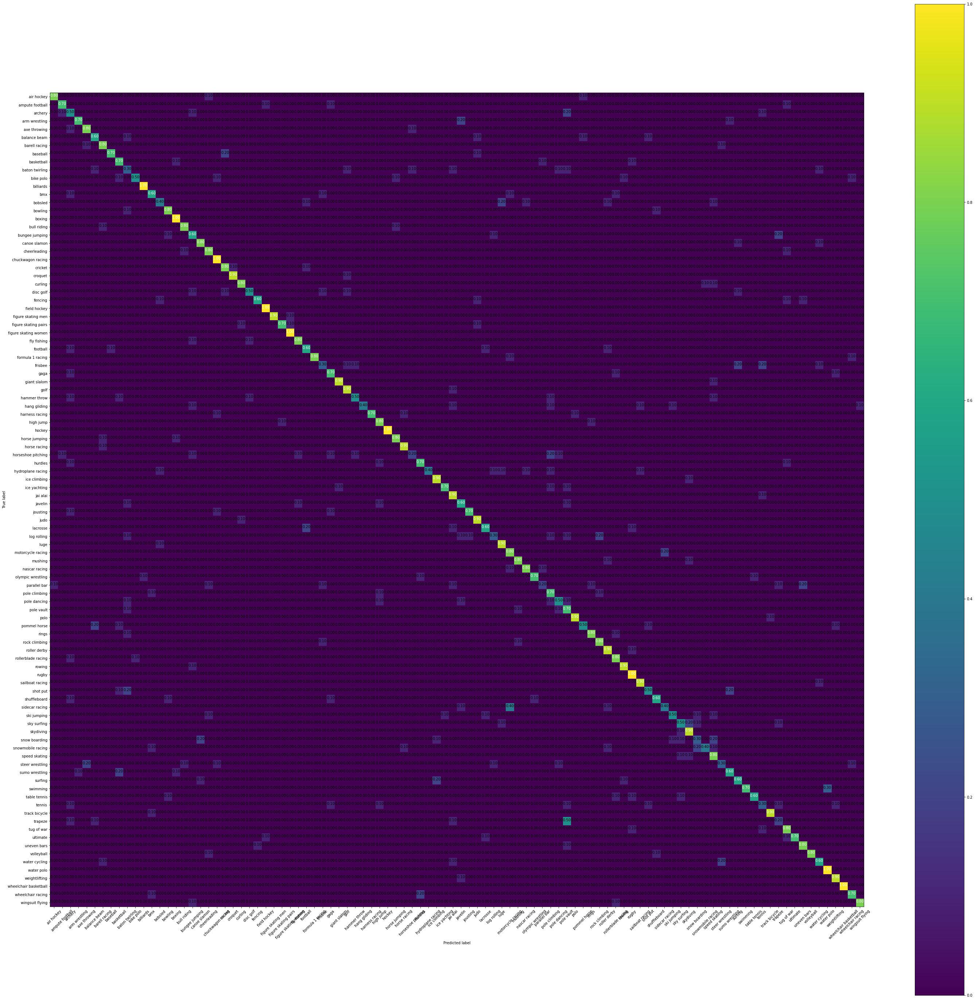

In [41]:
gc.collect()
cm_for_model(test_preds_gpu,labels_gpu)

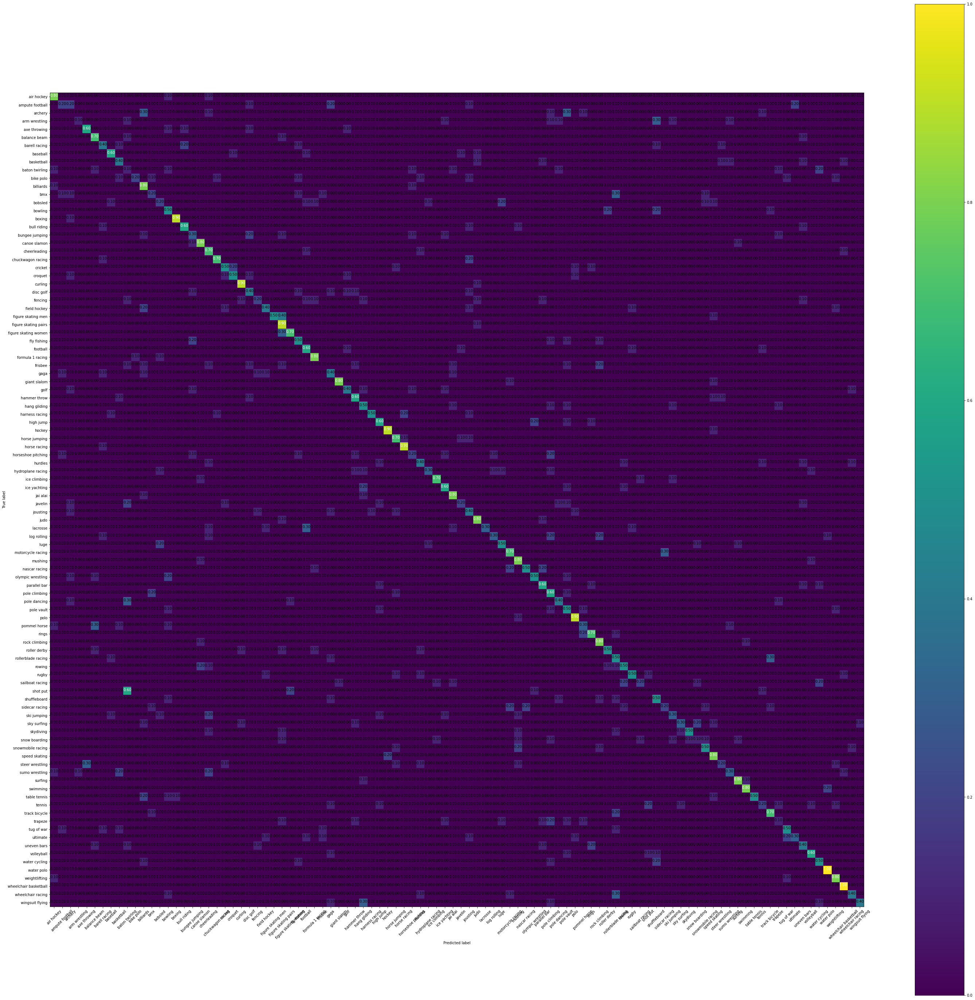

In [42]:
gc.collect()
cm_for_model(test_preds,labels)

In [9]:
import PIL
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
def show_images(images,model, k = 3,): 
    fig, ax = plt.subplots(k, 2, figsize=[6 * k, 6 * k])
    my_dict2 = {y:x for x,y in test_set.class_to_idx.items()}
    batch_size=1
    gc.collect()
    # ld=DataLoader(images,batch_size,num_workers=2,pin_memory=True)
    y_hat = torch.nn.functional.softmax(model(preprocess(images)), dim=1)
    preds = y_hat.amax(axis=1)
    preds_idx = y_hat.argmax(axis=1)
    print(preds)
    print(preds_idx)
    for i, image in enumerate(images):
        # image,_ = image
        pred = preds[i].item()
        pred_idx = preds_idx[i].item()
        # plt.figure(figsize=(16,16))
        ax[i%k, i//k].imshow(image.permute(1, 2, 0))
        ax[i%k, i//k].set_title(f"{pred_idx}: {my_dict2[pred_idx]} ({round(pred, 3)})")
        ax[i%k, i//k].axis('off')

In [ ]:
#@title
batch_size=1
#train_ld=DataLoader(train_set,batch_size,shuffle=True,num_workers=2,pin_memory=True)
val_ld=DataLoader(valid_set,batch_size,num_workers=40,pin_memory=True)
from torchvision.utils import make_grid

def show_batch(loader):
    for img,_ in loader:
        plt.figure(figsize=(16,16))
        plt.imshow(make_grid(img,16).permute(1,2,0))
        break


show_batch(val_ld)

tensor([0.9969, 0.2497, 0.4751, 0.6554, 0.6187, 0.9827],
       grad_fn=<AmaxBackward0>)
tensor([ 7, 71,  8,  8,  8,  8])


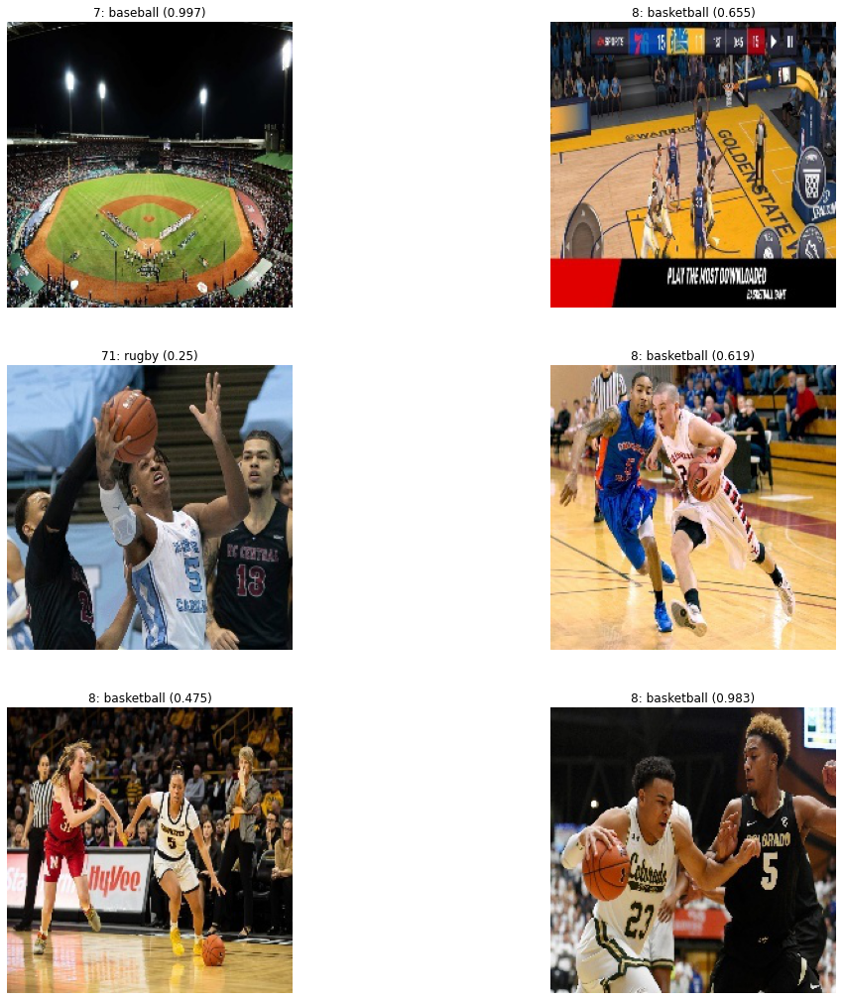

In [53]:
show_images(_X[39:45],model_dense_gpu, k=3)

tensor([0.9406, 0.2242, 0.4086, 0.9398, 0.4130, 0.9752],
       grad_fn=<AmaxBackward0>)
tensor([ 7, 82, 83, 97,  8,  8])


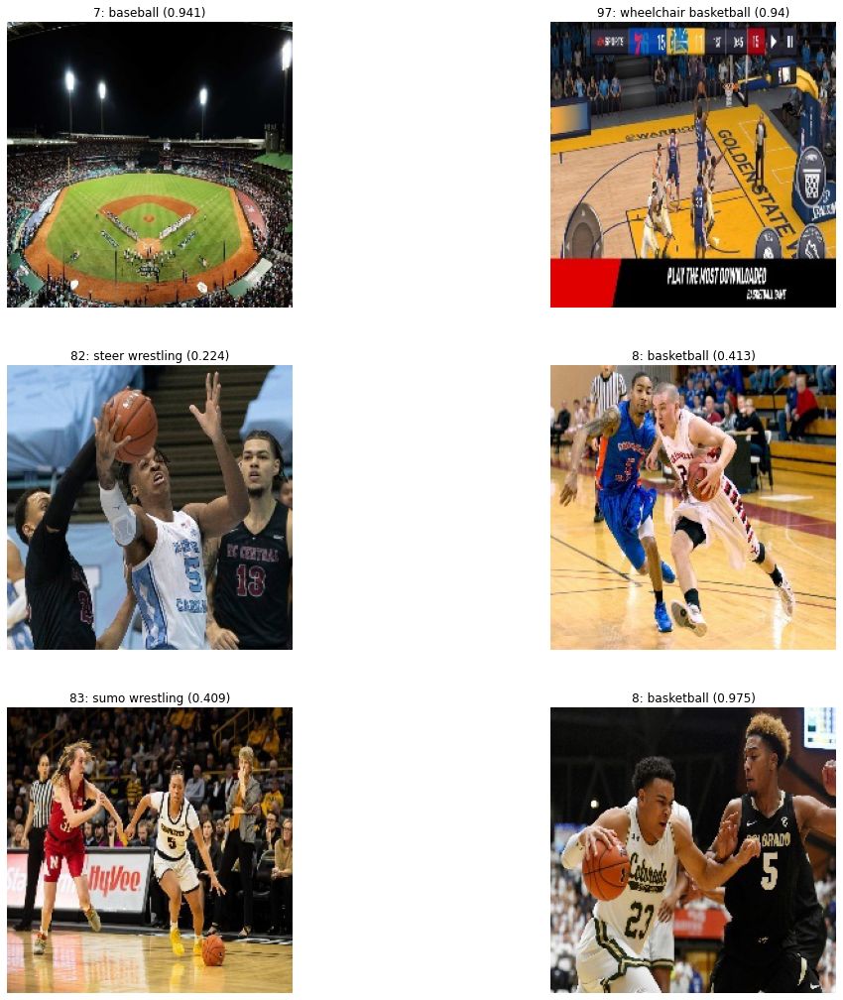

In [54]:
show_images(_X[39:45],model_dense, k=3)

In [12]:
def get_preds_idxs(images,model):
  y_hat = torch.nn.functional.softmax(model(preprocess(images)), dim=1)
  gc.collect()
  return y_hat.amax(axis=1),y_hat.argmax(axis=1)

In [14]:
preds_gpu,preds_idx_gpu = get_preds_idxs(_X,model_dense_gpu)
gc.collect()
preds,preds_idx = get_preds_idxs(_X,model_dense)
gc.collect()

0

In [15]:
gc.collect()
torch.save(preds_gpu,'./preds_gpu.pt')
torch.save(preds_idx_gpu,'./preds_idx_gpu.pt')
torch.save(preds,'./preds.pt')
torch.save(preds_idx,'./preds_idx.pt')
gc.collect()

0

In [16]:
!cp /content/preds.pt /content/drive/MyDrive/preds.pt
!cp /content/preds_idx.pt /content/drive/MyDrive/preds_idx.pt
!cp /content/preds_gpu.pt /content/drive/MyDrive/preds_gpu.pt
!cp /content/preds_idx_gpu.pt /content/drive/MyDrive/preds_idx_gpu.pt

In [10]:
gc.collect()
preds_gpu = torch.load('./preds_gpu.pt')
preds_idx_gpu = torch.load('./preds_idx_gpu.pt')
preds = torch.load('./preds.pt')
preds_idx = torch.load('./preds_idx.pt')
gc.collect()

40

In [11]:
def plot_photo(img):
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.imshow(img.cpu().permute([1,2,0]).squeeze())
    plt.show()
def show_image_mask_explanation(image, mask, explanation):
    fig, ax = plt.subplots(1, 3, figsize=[6 * 2, 6])
    ax[0].imshow(image.permute(1, 2, 0))
    ax[0].set_title("image")
    ax[1].imshow(mask, cmap="flag")
    ax[1].set_title("segmentation mask")
    ax[2].imshow(explanation, vmin=-1, vmax=1, cmap="RdBu")
    ax[2].set_title("explanation")
    plt.show()

## Functions

In [33]:
from captum.attr import Lime
from skimage import segmentation
from captum.attr import visualization
from captum.attr import IntegratedGradients
def lime_explainer(model):
  return Lime(model)
def lime_explanation(idx,targ,model):
  explainer = lime_explainer(model)
  mask = segmentation.slic(
      _X[idx].permute(1, 2, 0).mean(axis=2), 
      n_segments=100, 
      compactness=0.1, 
      start_label=0,
    )
  mask = segmentation.quickshift(
      _X[idx].permute(1, 2, 0), 
      kernel_size=14, 
      max_dist=7, 
      ratio=0.5
    )
  attr = explainer.attribute(
      preprocess(_X[idx].unsqueeze(0)), 
      target=targ, 
      n_samples=200, 
      feature_mask=torch.as_tensor(mask),
      show_progress=True
    )
  show_image_mask_explanation(_X[idx], mask, attr[0].mean(axis=0))

def show_attr(idx,targ,model,attr=None):
    explainer = lime_explainer(model)
    mask = segmentation.quickshift(
      _X[idx].permute(1, 2, 0), 
      kernel_size=14, 
      max_dist=7, 
      ratio=0.5
    )
    if attr is None:
      attr = explainer.attribute(
        preprocess(_X[idx].unsqueeze(0)), 
        target=targ, 
        n_samples=200, 
        feature_mask=torch.as_tensor(mask),
        show_progress=True
      )
    attr_map = attr[0]
    visualization.visualize_image_attr(
        attr_map.permute(1, 2, 0).numpy(),
        method='heat_map',
        sign='all',
        show_colorbar=True
    )
def show_igs(idx,targ,model):
  exp_ig = IntegratedGradients(model)
  attr_ig = exp_ig.attribute(preprocess(_X[idx].unsqueeze(0)), target=targ)
  show_attr(idx,targ,model,attr_ig)


In [34]:
from captum.attr import KernelShap


def show_shap(idx,targ,model):
  explainer = lime_explainer(model)
  ks = KernelShap(model)
  mask = segmentation.quickshift(
        _X[idx].permute(1, 2, 0), 
        kernel_size=14, 
        max_dist=7, 
        ratio=0.5
      )
  attr_ks = explainer.attribute(
      preprocess(_X[idx].unsqueeze(0)), 
      target=targ, 
      n_samples=200, 
      feature_mask=torch.as_tensor(mask),
      show_progress=True
    )

  show_attr(idx,targ,model,attr=attr_ks)


def show_shap_deep(idx,model,num_classes=2):
  exp_deep = shap.DeepExplainer(model, data=preprocess(_X))
  gc.collect()
  sv_deep, idx_deep = exp_deep.shap_values(preprocess(_X[idx:idx+1]), ranked_outputs=num_classes)
  idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}
  gc.collect()
  shap.image_plot(
    [sv.squeeze(0).transpose((1, 2, 0)) for sv in sv_deep], 
    _X[idx].permute(1, 2, 0).numpy(), 
    np.vectorize(lambda x: idx_to_labels[x])(idx_deep)
  )


def show_shap_gradient(idx,model,num_classes=2):
  class NetWrapper(torch.nn.Module):
    def __init__(self, model, preprocess):
        super(NetWrapper, self).__init__()
        self.preprocess = preprocess
        self.model = model
    def forward(self, x):
        x = self.preprocess(x)
        x = self.model(x)
        x = torch.nn.functional.softmax(x, dim=1)
        return x

  model_wrapper = NetWrapper(model, preprocess)
  exp_gradient = shap.GradientExplainer(model_wrapper, data=_X)
  gc.collect()
  sv_gradient, idx_gradient = exp_gradient.shap_values(_X[idx:idx+1], ranked_outputs=num_classes)
  idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}
  gc.collect()
  shap.image_plot(
    [sv.squeeze(0).transpose((1, 2, 0)) for sv in sv_gradient], 
    _X[idx].permute(1, 2, 0).numpy(), 
    np.vectorize(lambda x: idx_to_labels[x])(idx_gradient)
  )

In [35]:
idx_to_labels = {y:x for x,y in test_set.class_to_idx.items()}

## Photo 1

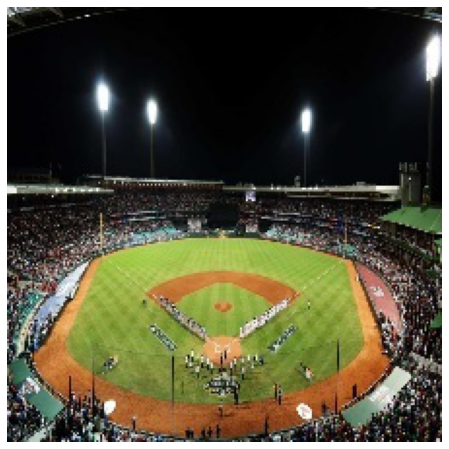

In [22]:
plot_photo(_X[39])

In [25]:
idx_to_labels[preds_idx_gpu[39].item()] # correct prediction

'baseball'

In [26]:
idx_to_labels[preds_idx[39].item()] # correct prediction

'baseball'

## Lime

Lime attribution: 100%|██████████| 200/200 [00:15<00:00, 12.59it/s]


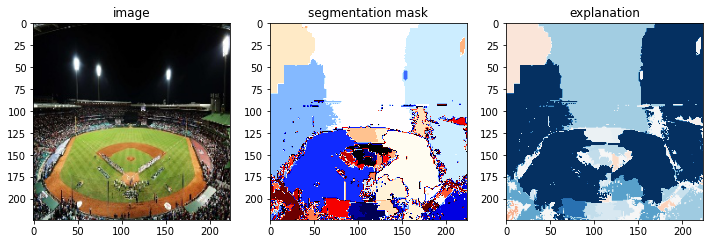

In [64]:
gc.collect()
lime_explanation(39,7,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:20<00:00, 10.00it/s]


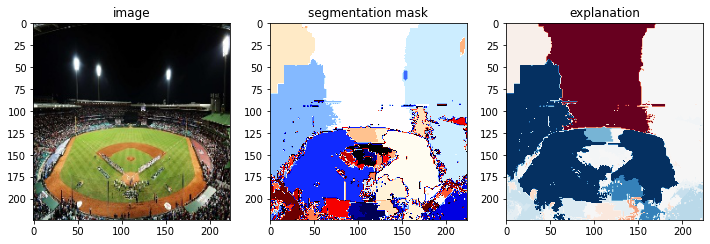

In [65]:
gc.collect()
lime_explanation(39,7,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:16<00:00, 11.83it/s]


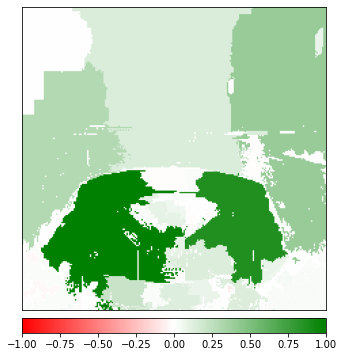

In [66]:
gc.collect()
show_attr(39,7,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:16<00:00, 11.94it/s]


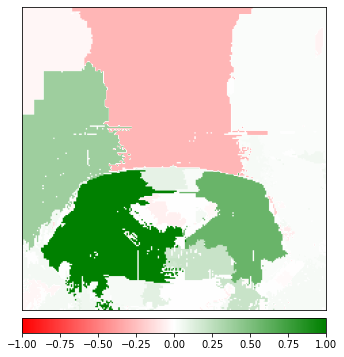

In [67]:
gc.collect()
show_attr(39,7,model_dense)

## Integrated Gradients

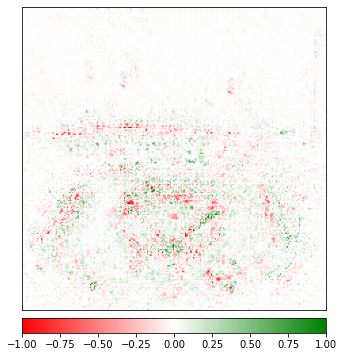

In [68]:
gc.collect()
show_igs(39,7,model_dense_gpu)

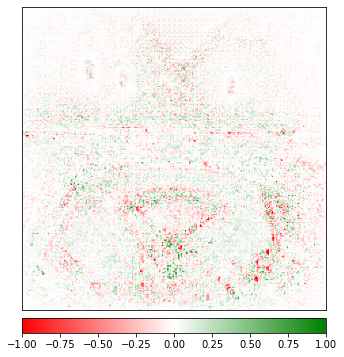

In [69]:
gc.collect()
show_igs(39,7,model_dense)

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.98it/s]


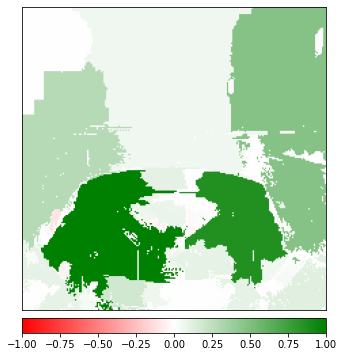

In [70]:
gc.collect()
show_shap(39,7,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.76it/s]


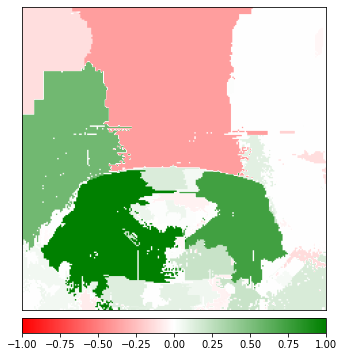

In [71]:
gc.collect()
show_shap(39,7,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


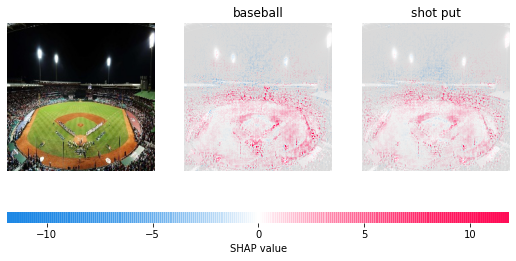

In [72]:
gc.collect()
show_shap_deep(39,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


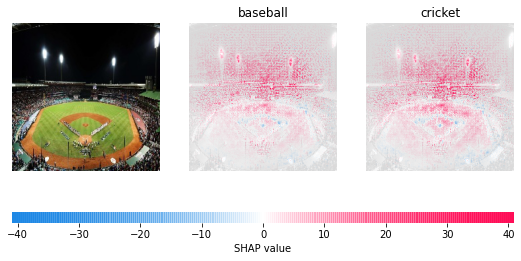

In [28]:
gc.collect()
show_shap_deep(39,model_dense)

Model trained on TPU seems a bit random here, while GPU-trained one highlights the edges of the visible field

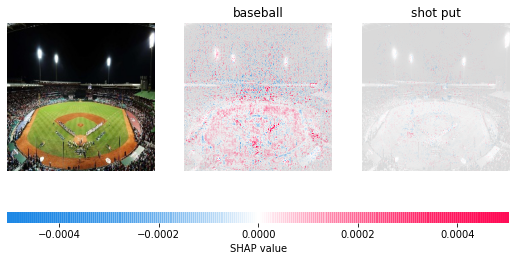

In [33]:
gc.collect()
show_shap_gradient(39,model_dense_gpu)

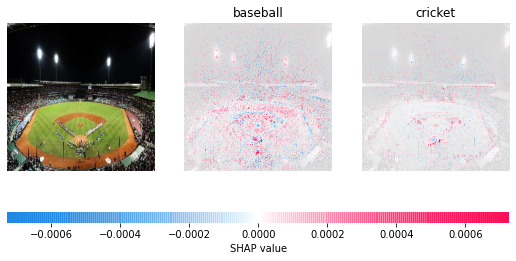

In [34]:
gc.collect()
show_shap_gradient(39,model_dense)

## Photo 2 (both models fail)

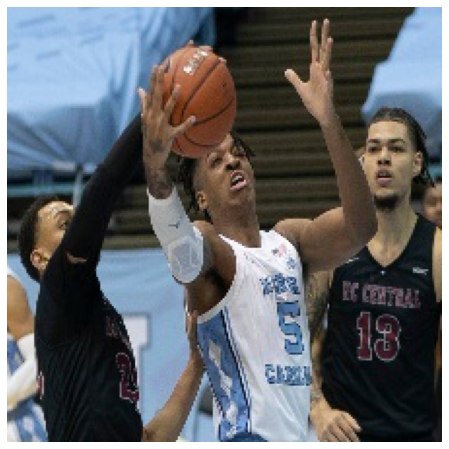

In [29]:
plot_photo(_X[40])

In [31]:
preds_idx_gpu[40].item()

71

In [27]:
idx_to_labels[preds_idx_gpu[40].item()] # correct prediction

'rugby'

In [32]:
preds_idx[40].item()

82

In [28]:
idx_to_labels[preds_idx[40].item()] # correct prediction

'steer wrestling'

## Lime

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.65it/s]


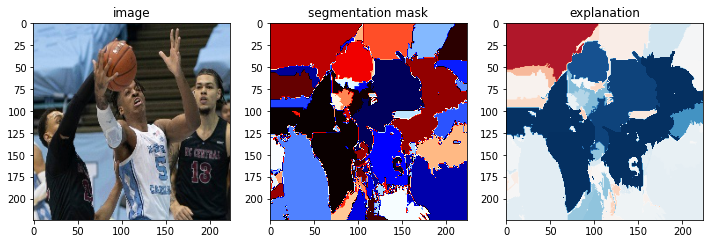

In [33]:
gc.collect()
lime_explanation(40,71,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:15<00:00, 12.78it/s]


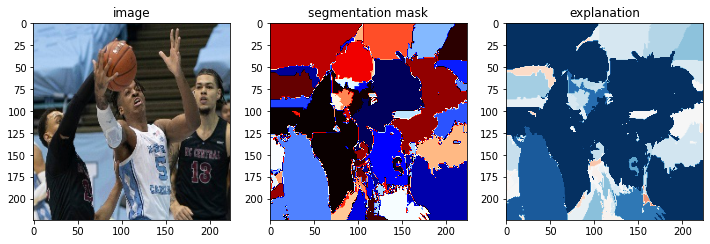

In [34]:
gc.collect()
lime_explanation(40,82,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:20<00:00,  9.84it/s]


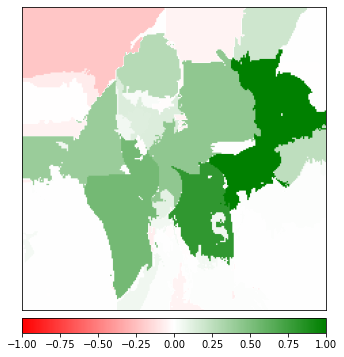

In [35]:
gc.collect()
show_attr(40,71,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.81it/s]


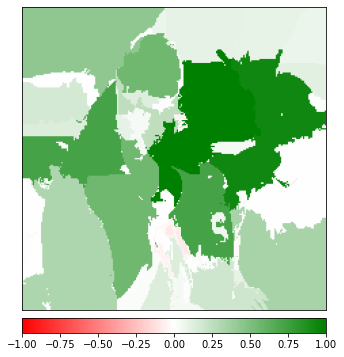

In [36]:
gc.collect()
show_attr(40,82,model_dense)

## Integrated Gradients

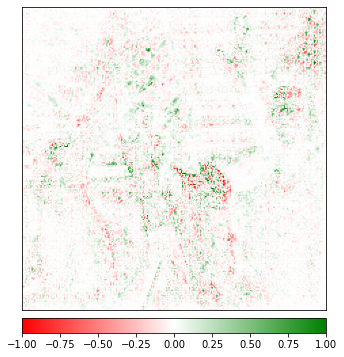

In [15]:
gc.collect()
show_igs(40,71,model_dense_gpu)

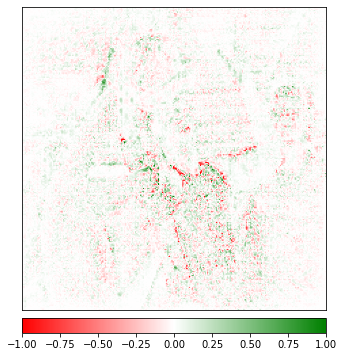

In [16]:
gc.collect()
show_igs(40,82,model_dense)

We can clearly see a hand pattern (especially in the second picture)

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.44it/s]


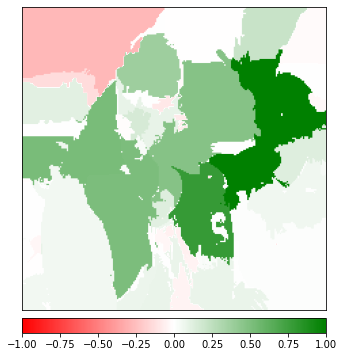

In [17]:
gc.collect()
show_shap(40,71,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.69it/s]


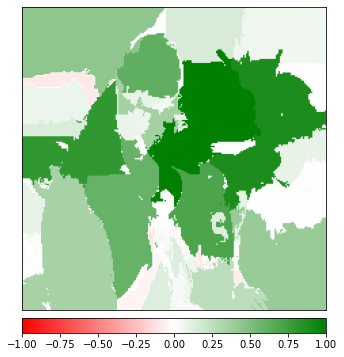

In [18]:
gc.collect()
show_shap(40,82,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


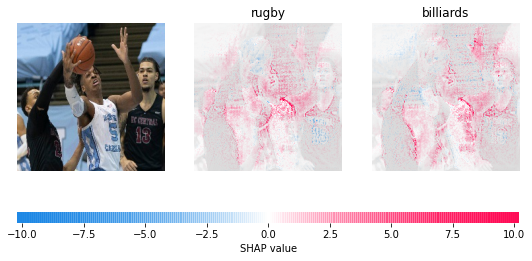

In [19]:
gc.collect()
show_shap_deep(40,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


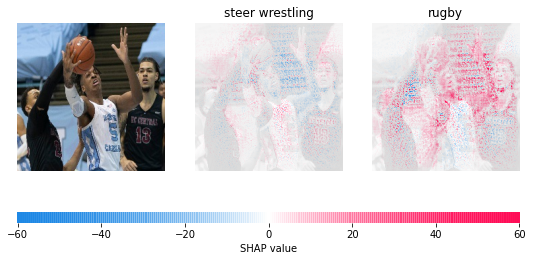

In [2]:
gc.collect()
show_shap_deep(40,model_dense)

In [11]:
del show_shap_deep
gc.collect()

331

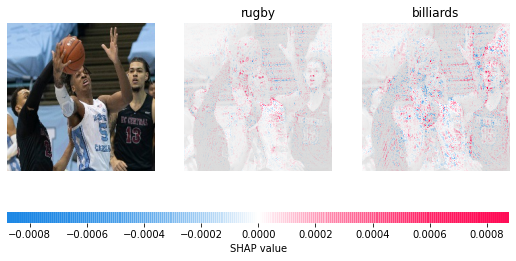

In [12]:
gc.collect()
show_shap_gradient(40,model_dense_gpu)

In [18]:
gc.collect()

88

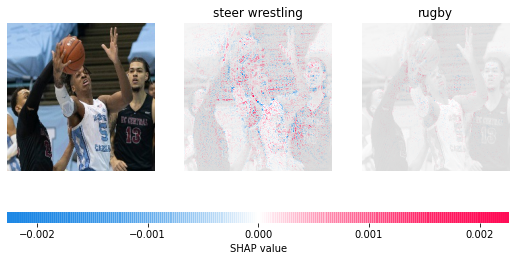

In [19]:
gc.collect()
show_shap_gradient(40,model_dense)

## Photo 3 (gpu-trained was right, tpu-trained was wrong)

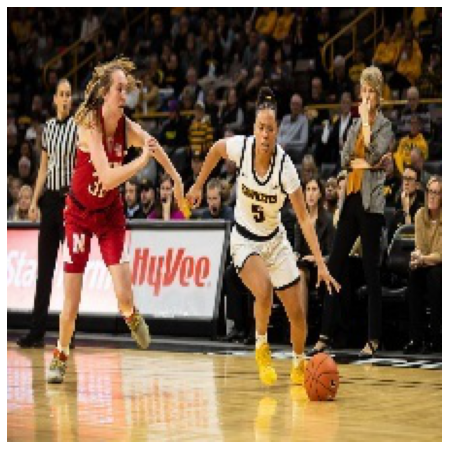

In [20]:
plot_photo(_X[41])

In [23]:
print(preds_idx_gpu[41].item(),idx_to_labels[preds_idx_gpu[41].item()])
print(preds_idx[41].item(),idx_to_labels[preds_idx[41].item()])

8 basketball
83 sumo wrestling


## Lime

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 11.06it/s]


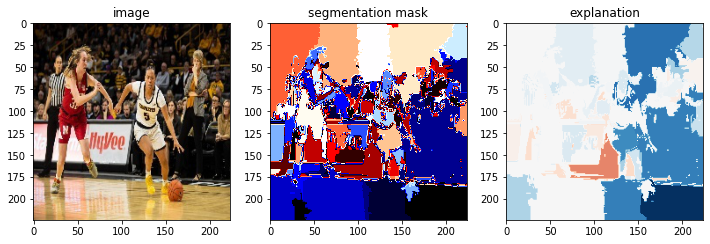

In [24]:
gc.collect()
lime_explanation(41,8,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.88it/s]


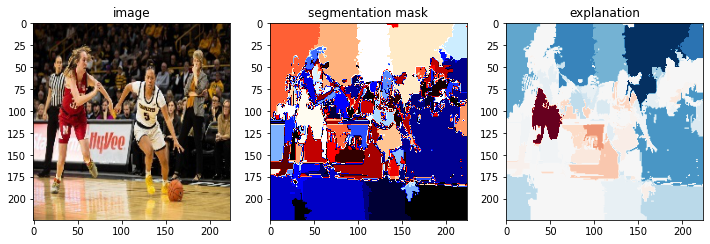

In [25]:
gc.collect()
lime_explanation(41,83,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.13it/s]


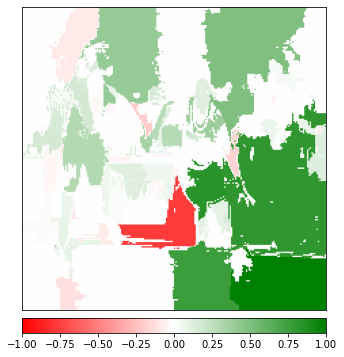

In [26]:
gc.collect()
show_attr(41,8,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.20it/s]


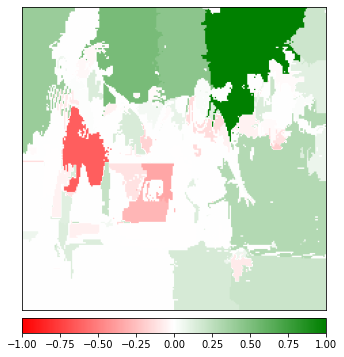

In [27]:
gc.collect()
show_attr(41,83,model_dense)

GPU-trained model took seemingly correct way to recognize the basketball field, whilst TPU-trained one has randomly chosen an area with nothing more than people in the background

## Integrated Gradients

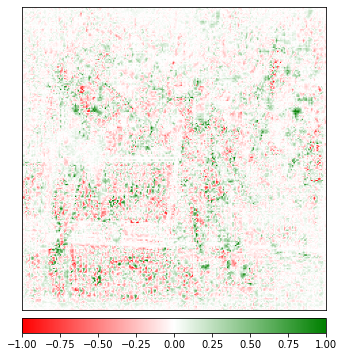

In [28]:
gc.collect()
show_igs(41,8,model_dense_gpu)

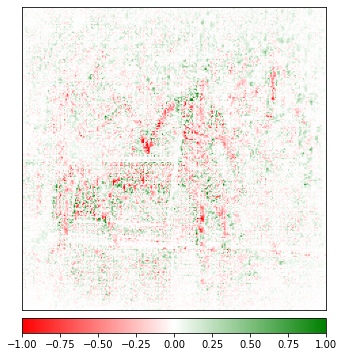

In [29]:
gc.collect()
show_igs(41,83,model_dense)

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 11.04it/s]


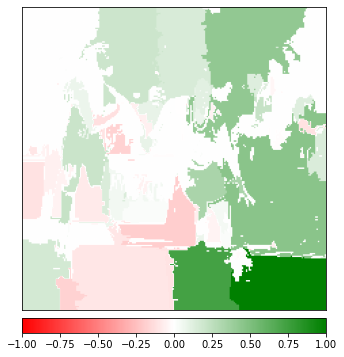

In [30]:
gc.collect()
show_shap(41,8,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.93it/s]


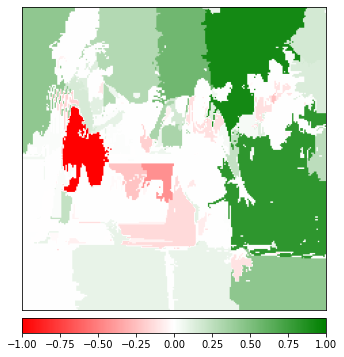

In [31]:
gc.collect()
show_shap(41,83,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


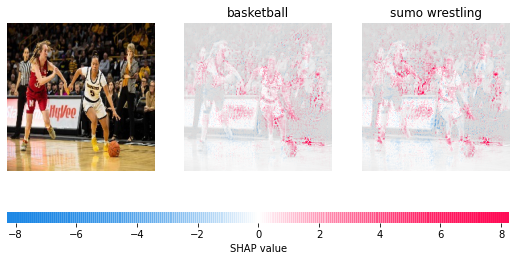

In [2]:
gc.collect()
show_shap_deep(41,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


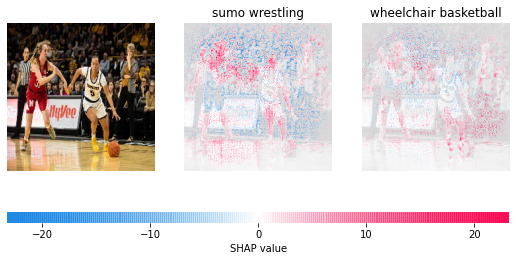

In [2]:
gc.collect()
show_shap_deep(41,model_dense)

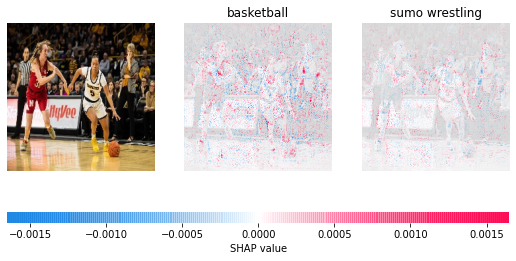

In [3]:
gc.collect()
show_shap_gradient(41,model_dense_gpu)

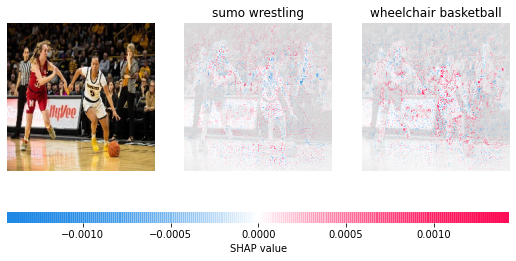

In [4]:
gc.collect()
show_shap_gradient(41,model_dense)

## Photo 4 (TPU-trained was right, GPU-trained was wrong)

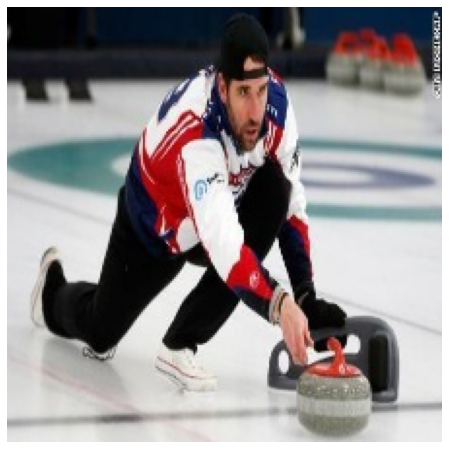

In [32]:
plot_photo(_X[115])

In [34]:
print(preds_idx_gpu[115].item(),idx_to_labels[preds_idx_gpu[115].item()])
print(preds_idx[115].item(),idx_to_labels[preds_idx[115].item()])

81 speed skating
23 curling


## Lime

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.81it/s]


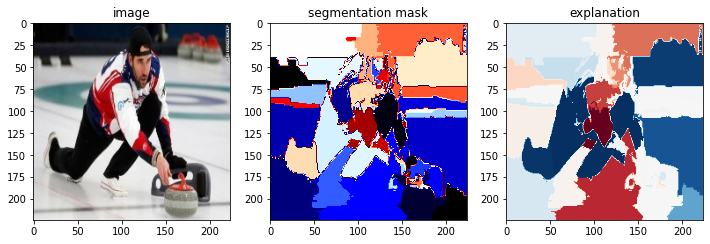

In [35]:
gc.collect()
lime_explanation(115,81,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.38it/s]


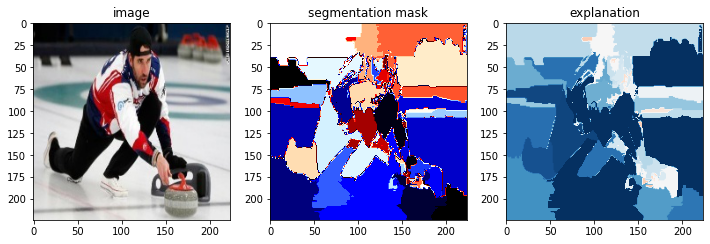

In [36]:
gc.collect()
lime_explanation(115,23,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:16<00:00, 12.09it/s]


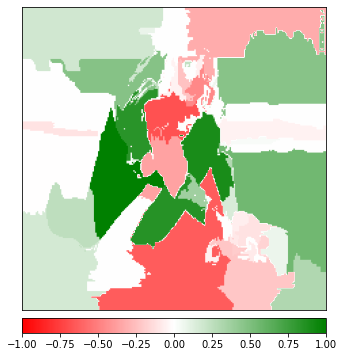

In [38]:
gc.collect()
show_attr(115,81,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.66it/s]


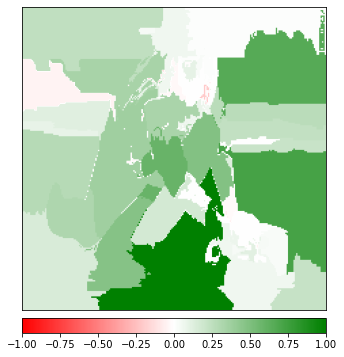

In [37]:
gc.collect()
show_attr(115,23,model_dense)

Models interpreted various areas in a totally different way

## Integrated Gradients

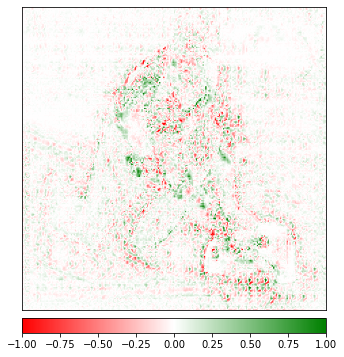

In [39]:
gc.collect()
show_igs(115,81,model_dense_gpu)

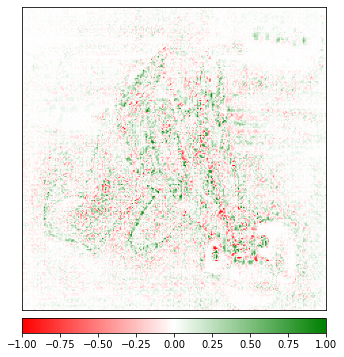

In [40]:
gc.collect()
show_igs(115,23,model_dense)

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:15<00:00, 12.52it/s]


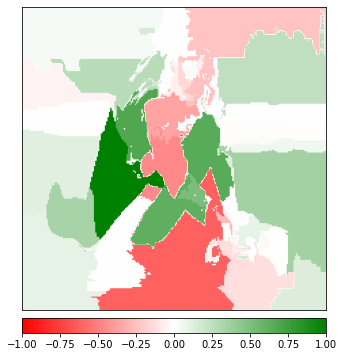

In [41]:
gc.collect()
show_shap(115,81,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.40it/s]


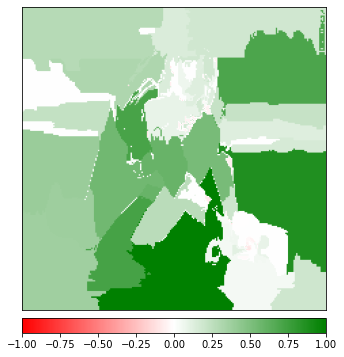

In [42]:
gc.collect()
show_shap(115,23,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


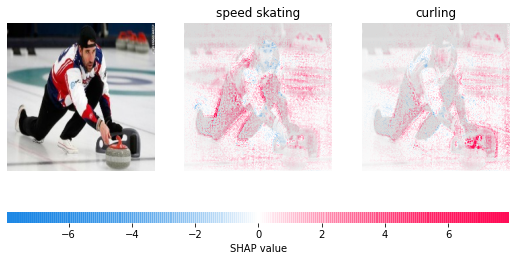

In [2]:
gc.collect()
show_shap_deep(115,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


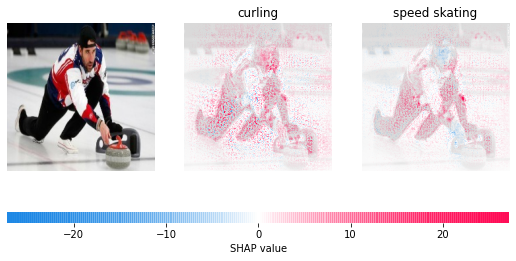

In [2]:
gc.collect()
show_shap_deep(115,model_dense)

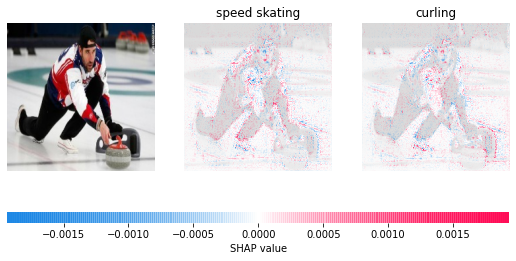

In [3]:
gc.collect()
show_shap_gradient(115,model_dense_gpu)

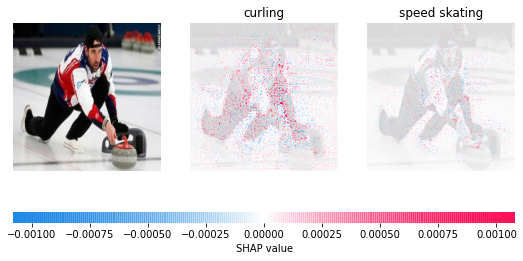

In [4]:
gc.collect()
show_shap_gradient(115,model_dense)

## Photo 5 - both were wrong

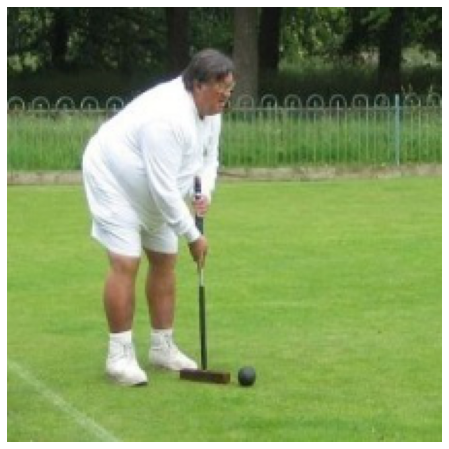

In [5]:
plot_photo(_X[113])

In [6]:
print(preds_idx_gpu[113].item(),idx_to_labels[preds_idx_gpu[113].item()])
print(preds_idx[113].item(),idx_to_labels[preds_idx[113].item()])

36 golf
36 golf


## Lime

Lime attribution: 100%|██████████| 200/200 [00:19<00:00, 10.53it/s]


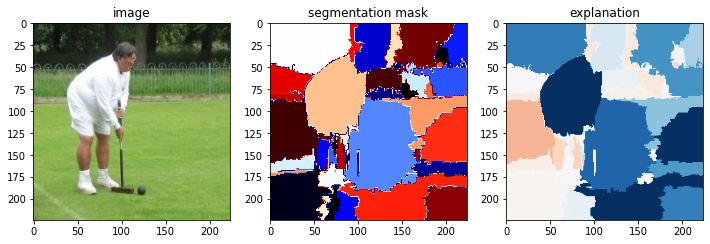

In [7]:
gc.collect()
lime_explanation(113,36,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.50it/s]


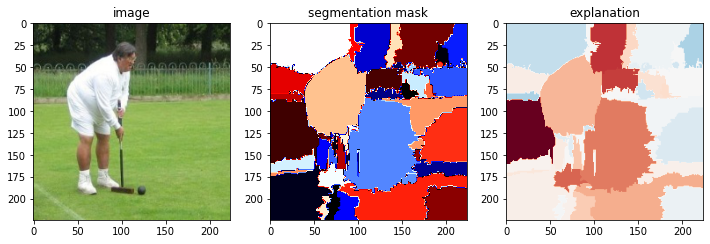

In [8]:
gc.collect()
lime_explanation(113,36,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 10.89it/s]


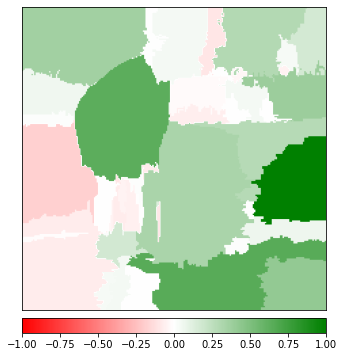

In [9]:
gc.collect()
show_attr(113,36,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:18<00:00, 11.00it/s]


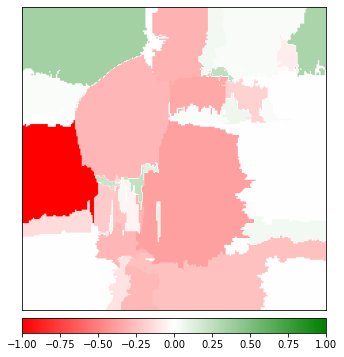

In [10]:
gc.collect()
show_attr(113,36,model_dense)

Interestingly, despite choosing the same label, models seem to be looking at two very different angles

## Integrated Gradients

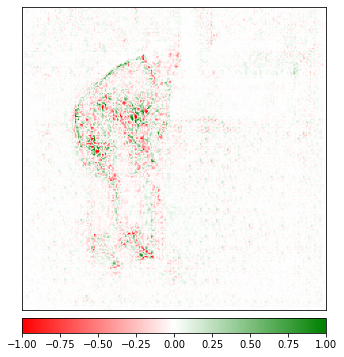

In [11]:
gc.collect()
show_igs(113,36,model_dense_gpu)

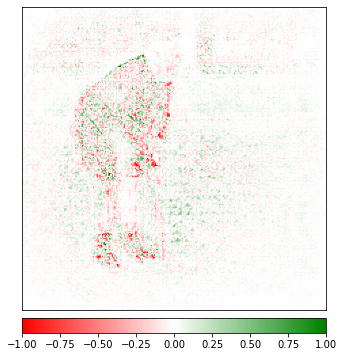

In [12]:
gc.collect()
show_igs(113,36,model_dense)

Player is clearly visible

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.61it/s]


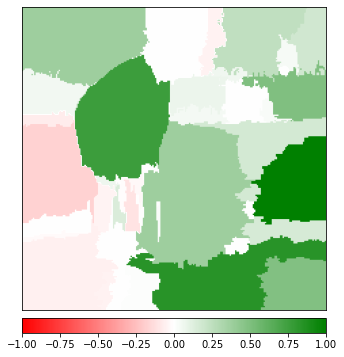

In [13]:
gc.collect()
show_shap(113,36,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:17<00:00, 11.55it/s]


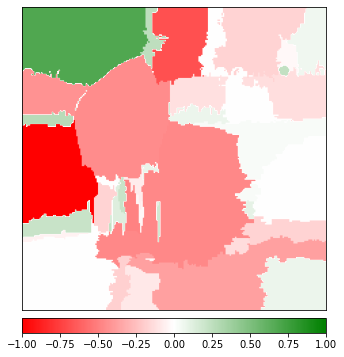

In [16]:
gc.collect()
show_shap(113,36,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


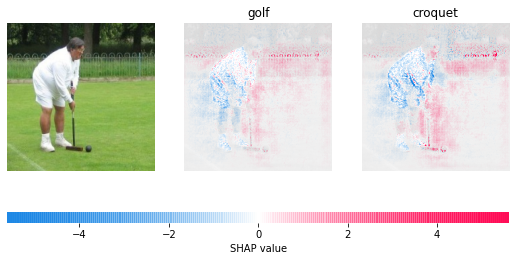

In [2]:
gc.collect()
show_shap_deep(113,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


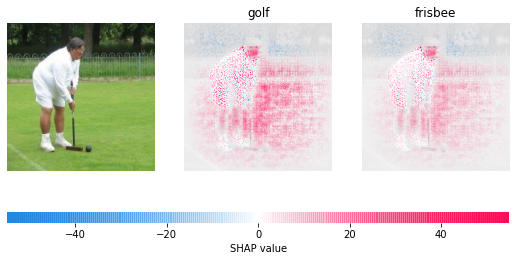

In [2]:
gc.collect()
show_shap_deep(113,model_dense)

We can see that gpu-trained model considered croquet label, which was correct

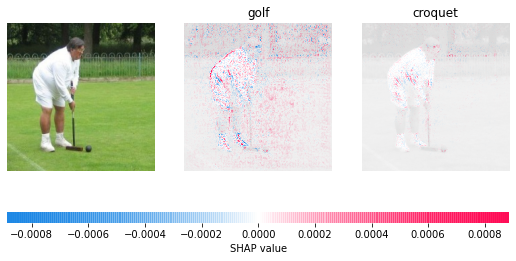

In [3]:
gc.collect()
show_shap_gradient(113,model_dense_gpu)

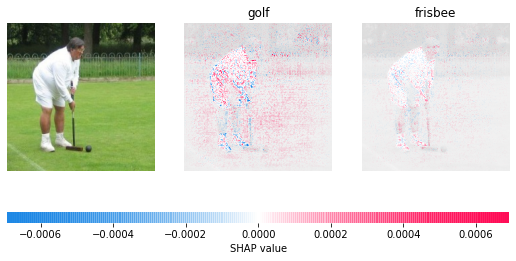

In [4]:
gc.collect()
show_shap_gradient(113,model_dense)

## Photo 6

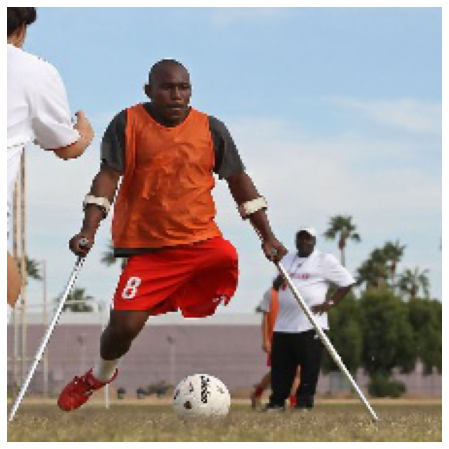

In [5]:
plot_photo(_X[5])

In [6]:
print(preds_idx_gpu[5].item(),idx_to_labels[preds_idx_gpu[5].item()])
print(preds_idx[5].item(),idx_to_labels[preds_idx[5].item()])

1 ampute football
2 archery


## Lime

Lime attribution: 100%|██████████| 200/200 [00:26<00:00,  7.62it/s]


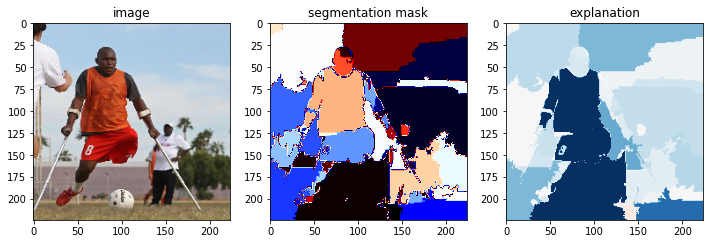

In [7]:
gc.collect()
lime_explanation(5,1,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:25<00:00,  7.90it/s]


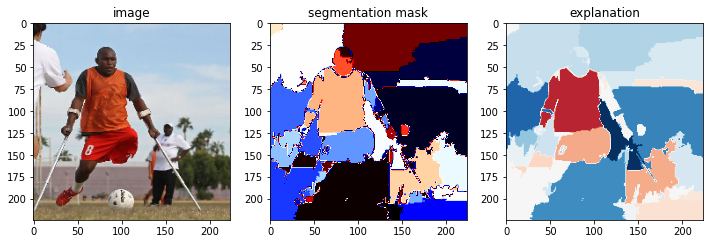

In [8]:
gc.collect()
lime_explanation(5,2,model_dense)

Lime attribution: 100%|██████████| 200/200 [00:23<00:00,  8.34it/s]


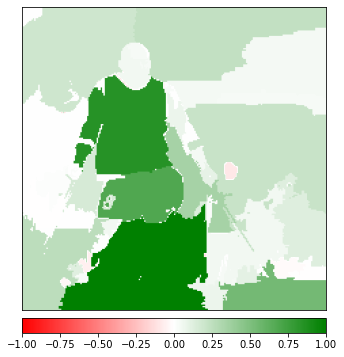

In [9]:
gc.collect()
show_attr(5,1,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:23<00:00,  8.47it/s]


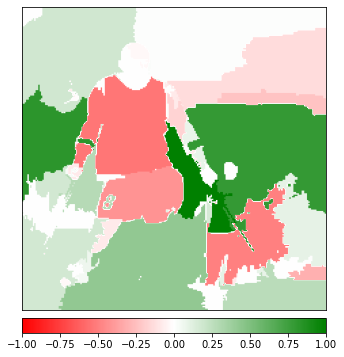

In [10]:
gc.collect()
show_attr(5,2,model_dense)

Apparently, TPU-trained model took the bow-shaped space between the body and an arm as a real bow...

## Integrated Gradients

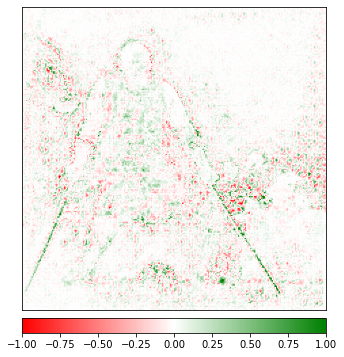

In [11]:
gc.collect()
show_igs(5,1,model_dense_gpu)

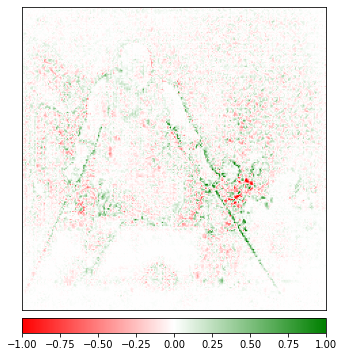

In [12]:
gc.collect()
show_igs(5,2,model_dense)

## SHAP

Lime attribution: 100%|██████████| 200/200 [00:28<00:00,  7.10it/s]


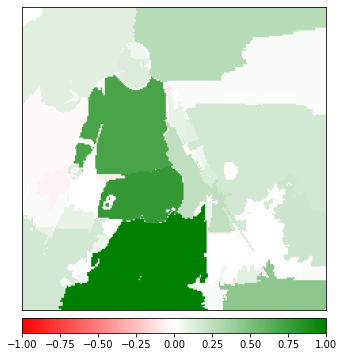

In [13]:
gc.collect()
show_shap(5,1,model_dense_gpu)

Lime attribution: 100%|██████████| 200/200 [00:23<00:00,  8.41it/s]


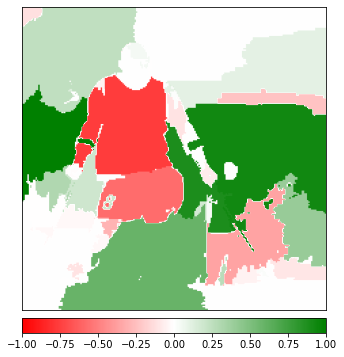

In [14]:
gc.collect()
show_shap(5,2,model_dense)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


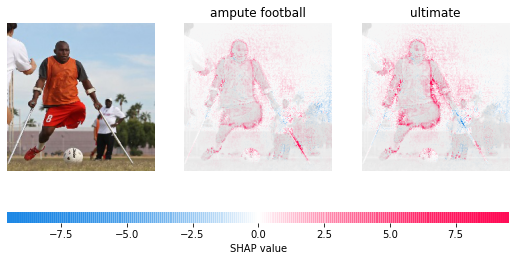

In [2]:
gc.collect()
show_shap_deep(5,model_dense_gpu)

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
Note that order of the arguments: ceil_mode and return_indices will changeto match the args list in nn.MaxPool2d in a future release.


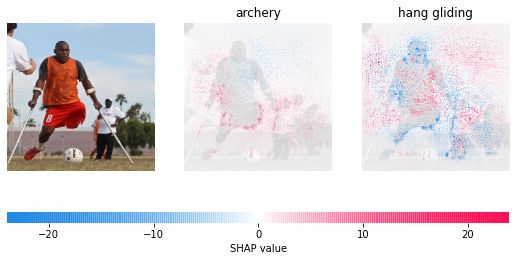

In [2]:
gc.collect()
show_shap_deep(5,model_dense)

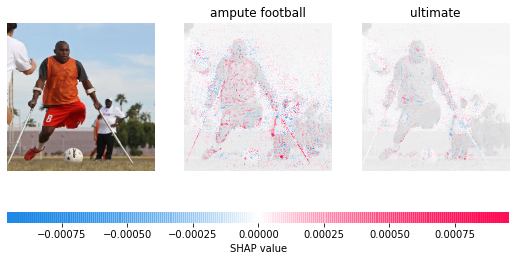

In [3]:
gc.collect()
show_shap_gradient(5,model_dense_gpu)

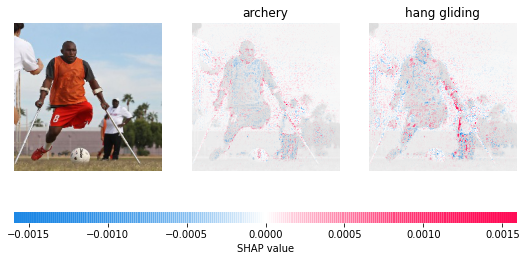

In [5]:
gc.collect()
show_shap_gradient(5,model_dense)

# Summary

* TPU-trained model didn't exactly live up to hopes which I had put in it. It was probably the size of our dataset and relatively low number of epochs that compromised its effectivenes, but the training took a lot less than in case of the traditional GPU

* GPU model was trained for around 50 epochs, which resulted in almost 70% accuracy. I consider it as a decent score given that the number of classes was really significant (100 different labels)

* Networks' behaviours were sometimes a bit unexplainable. There were some cases of classifing based on random areas, but generally even if the correct label was not predicted, it was among those of highest probability in case of both models